In [1]:
from pathlib import Path
from scipy.stats import gaussian_kde
import anndata
import gc
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
import seaborn as sns
import pandas as pd

In [2]:
gc.collect()

0

In [3]:
# Paths — relative to this notebook's location (GVHD_Reproducibility-main/Sc&TCR_Pipelines/)
PROJECT_ROOT = Path('../..')

# Input paths
TCELL_BC_PATH     = PROJECT_ROOT / 'adata_file' / 'tcell_batch_corrected.h5ad'

# Output paths (figures managed separately in code)
DEDF_OUTPUT_PATH   = PROJECT_ROOT / 'adata_file' / 'dedf_T_cells_subsets.csv'
DEDF_SC_OUTPUT_PATH   = PROJECT_ROOT / 'adata_file' / 'dedf_T_cells_subsets_sc.csv'
DEDF_SC_LEIDEN_OUTPUT_PATH   = PROJECT_ROOT / 'adata_file' / 'dedf_leiden_subsets_sc.csv'
TCELL_ANN_SC_PATH  = PROJECT_ROOT / 'adata_file' / 'tcell_ann_sc.h5ad'
TCELL_ANN_PATH     = PROJECT_ROOT / 'adata_file' / 'tcell_ann.h5ad'
DEDF_SC_CD4_OUTPUT_PATH   = PROJECT_ROOT / 'adata_file' / 'dedf_T_cells_subsets_CD4_sc.csv'

In [4]:
tcell_ann = anndata.read_h5ad(TCELL_BC_PATH)

#tcell_ann = tcell_ann[tcell_ann.obs["LPorIE"]=="Lamina Propria Cells"]

tcell_ann

AnnData object with n_obs × n_vars = 50416 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'hvg', 'leiden', 'leiden_0.15', 'leiden_0.15_colors', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_scVI', 'X_umap', 'scvi'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

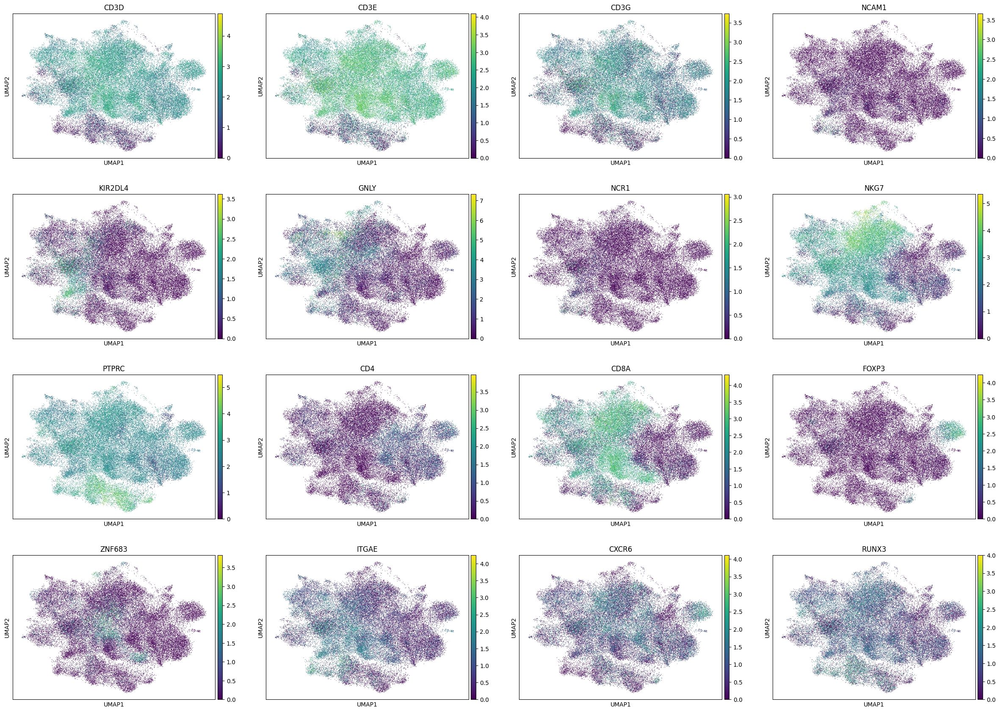

In [5]:
sc.pl.umap(tcell_ann, color=['CD3D','CD3E','CD3G',"NCAM1","KIR2DL4","GNLY","NCR1","NKG7","PTPRC",'CD4','CD8A','FOXP3','ZNF683', 'ITGAE', 'CXCR6', 'RUNX3'])

In [6]:
gc.collect()

66381

In [7]:
sc.tl.rank_genes_groups(tcell_ann, groupby="leiden",use_raw=False, method='wilcoxon')
dedf = sc.get.rank_genes_groups_df(tcell_ann, group=None)
dedf.to_csv(DEDF_OUTPUT_PATH)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [8]:
leidenlst  = [i for i in range(tcell_ann.obs['leiden'].unique().shape[0])]

In [9]:
def view_doublets_bycluster(Tcell_markers,BCell_markers,namex,namey,tcell_ann_concat):
    num_cols = 4
    fig, ax = plt.subplots(7, 4, figsize=(20,25), gridspec_kw={'wspace':0.1},layout = 'constrained')

    for i, leiden in enumerate(leidenlst):
        row = i // num_cols
        col = i % num_cols
        subTcell = tcell_ann[tcell_ann.obs['leiden'] == str(leiden)]
        x = subTcell[:,'CD3D'].X.toarray()

        x_all =  np.zeros([np.shape(x)[0],len(Tcell_markers)])
        for j in np.arange(len(Tcell_markers)):
            x_all[:,j] = subTcell[:,Tcell_markers[j]].X.toarray()[:,0]
        x = np.mean(x_all,axis =1)


        y_all = np.zeros([np.shape(x)[0],len(BCell_markers)])
        for j in np.arange(len(BCell_markers)):
            y_all[:,j] = subTcell[:,BCell_markers[j]].X.toarray()[:,0]

        y = np.mean(y_all,axis=1)
        xy = np.vstack([x.T,y.T])
        try:
            z = gaussian_kde(xy)(xy)
            #ax = ax[row][col]
            im=ax[row][col].scatter(x,y, c=z, s=10)
            ax[row][col].set_xlabel(namex)
            ax[row][col].set_ylabel(namey)
            ax[row][col].set_title(leiden)

            plt.colorbar(im)
        except:
            pass

    return

def doublet_lst(Tcell_markers,BCell_markers,namex,namey,tcell_ann_concat):
    x = tcell_ann[:,'CD3D'].X.toarray()
    x_all = np.zeros([np.shape(x)[0],len(Tcell_markers)])
    y_all = np.zeros([np.shape(x)[0],len(BCell_markers)])
    for j in np.arange(len(BCell_markers)):
        y_all[:,j] = tcell_ann[:,BCell_markers[j]].X.toarray()[:,0]
    for j in np.arange(len(Tcell_markers)):
        x_all[:,j] =tcell_ann[:,Tcell_markers[j]].X.toarray()[:,0]
    x = np.mean(x_all,axis =1)
    y = np.mean(y_all,axis=1)
    xy = np.vstack([x.T,y.T])

    z = gaussian_kde(xy)(xy)
    fig, ax = plt.subplots()
    im=ax.scatter(x,y, c=z, s=10)
    #ax.scatter(x,y, c=z, s=10)
    ax.set_xlabel(namex)
    ax.set_ylabel(namey)
    plt.colorbar(im)
    B_doublet_idx = y>0
    print(sum(B_doublet_idx))
    return B_doublet_idx

In [10]:
def view_doublets_bycluster(Tcell_markers,BCell_markers,namex,namey,tcell_ann_concat):
    num_cols = 4
    num_rows = (len(leidenlst) + num_cols - 1) // num_cols
    fig, ax = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 4),
                           gridspec_kw={'wspace':0.1}, layout='constrained', squeeze=False)

    for i, leiden in enumerate(leidenlst):
        row = i // num_cols
        col = i % num_cols
        subTcell = tcell_ann[tcell_ann.obs['leiden'] == str(leiden)]
        x = subTcell[:,'CD3D'].X.toarray()

        x_all =  np.zeros([np.shape(x)[0],len(Tcell_markers)])
        for j in np.arange(len(Tcell_markers)):
            x_all[:,j] = subTcell[:,Tcell_markers[j]].X.toarray()[:,0]
        x = np.mean(x_all,axis =1)


        y_all = np.zeros([np.shape(x)[0],len(BCell_markers)])
        for j in np.arange(len(BCell_markers)):
            y_all[:,j] = subTcell[:,BCell_markers[j]].X.toarray()[:,0]

        y = np.mean(y_all,axis=1)
        xy = np.vstack([x.T,y.T])
        try:
            z = gaussian_kde(xy)(xy)
            im=ax[row][col].scatter(x,y, c=z, s=10)
            ax[row][col].set_xlabel(namex)
            ax[row][col].set_ylabel(namey)
            ax[row][col].set_title(leiden)
            plt.colorbar(im, ax=ax[row][col])
        except:
            pass

    # Hide unused subplots
    for j in range(len(leidenlst), num_rows * num_cols):
        ax[j // num_cols][j % num_cols].set_visible(False)

    return

def doublet_lst(Tcell_markers,BCell_markers,namex,namey,tcell_ann):
    x = tcell_ann[:,'CD3D'].X.toarray()
    x_all = np.zeros([np.shape(x)[0],len(Tcell_markers)])
    y_all = np.zeros([np.shape(x)[0],len(BCell_markers)])
    for j in np.arange(len(BCell_markers)):
        y_all[:,j] = tcell_ann[:,BCell_markers[j]].X.toarray()[:,0]
    for j in np.arange(len(Tcell_markers)):
        x_all[:,j] =tcell_ann[:,Tcell_markers[j]].X.toarray()[:,0]
    x = np.mean(x_all,axis =1)
    y = np.mean(y_all,axis=1)
    xy = np.vstack([x.T,y.T])

    z = gaussian_kde(xy)(xy)
    fig, ax = plt.subplots()
    im=ax.scatter(x,y, c=z, s=10)
    ax.set_xlabel(namex)
    ax.set_ylabel(namey)
    plt.colorbar(im)
    B_doublet_idx = y>0
    print(sum(B_doublet_idx))
    return B_doublet_idx

606


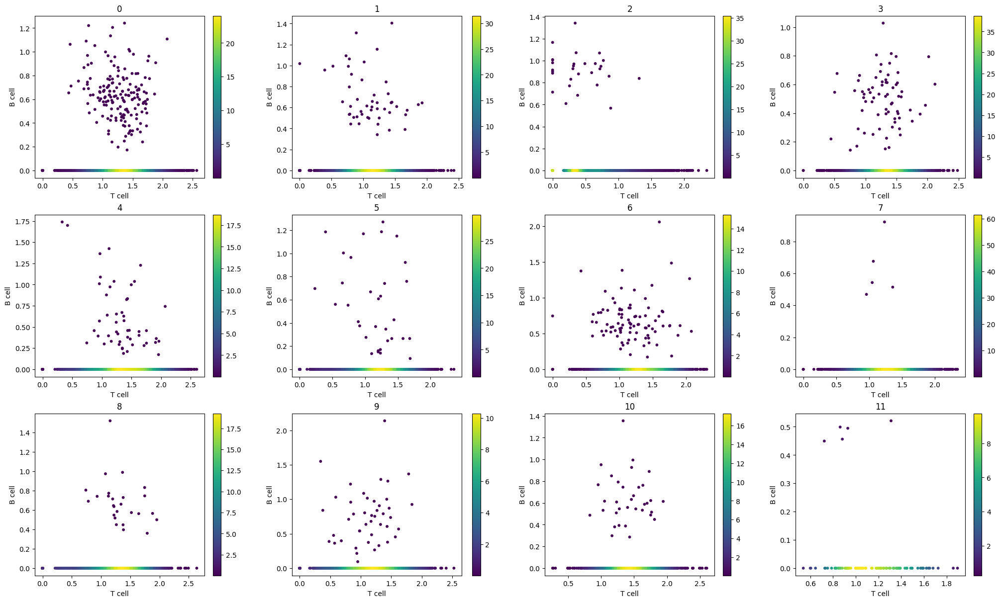

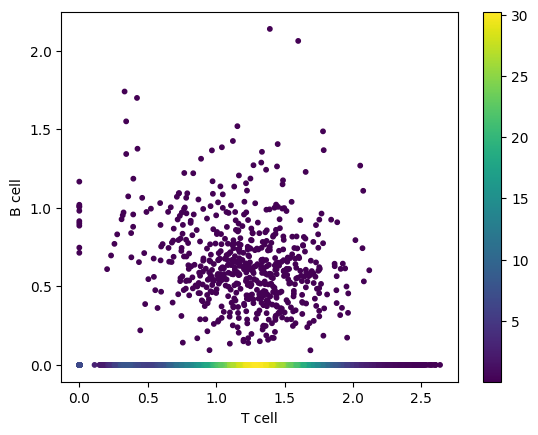

In [11]:
# Bcell & Tcell doublets_ls_GOOD
# Studies have found 'CD79A' on T cells
Tcell_markers = ['CD3E','CD3D','TRAC','TRBC1','TRBC2','TRDC']
BCell_markers = ['CD19','MS4A1']
namex = 'T cell'
namey = 'B cell'
view_doublets_bycluster(Tcell_markers,BCell_markers,namex,namey,tcell_ann)
B_doublet_idx = doublet_lst(Tcell_markers,BCell_markers,namex,namey,tcell_ann)

4692


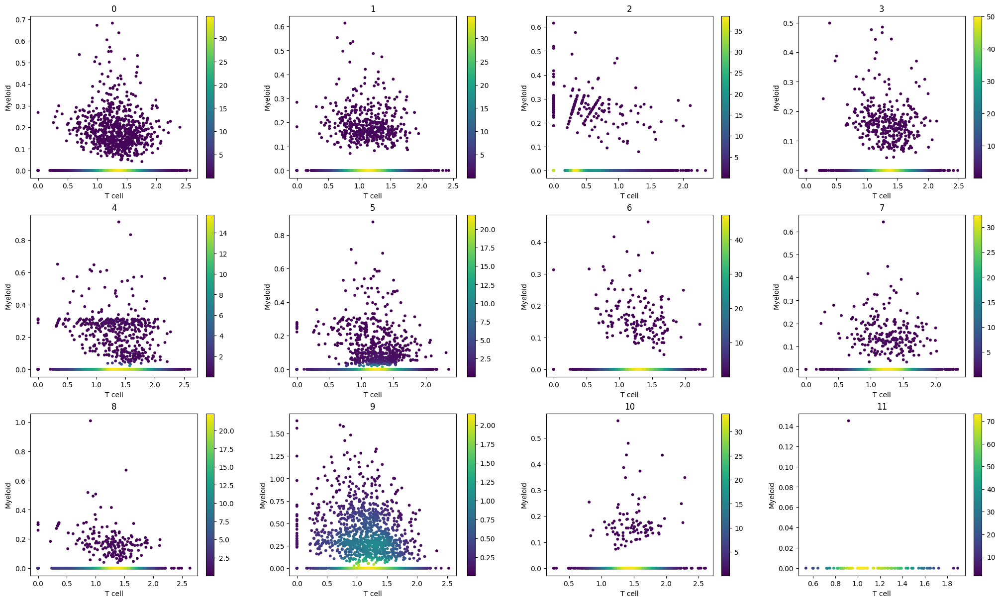

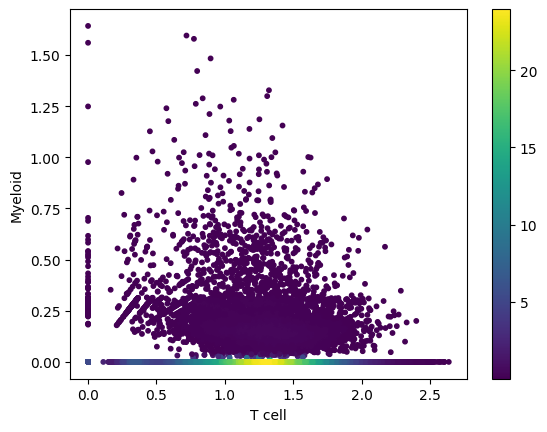

In [12]:
# Myeloid & Tcell doublets_ls_GOOD
Tcell_markers = ['CD3E','CD3D','TRAC','TRBC1','TRBC2','TRDC']
Myeloid = ['CD68','APOE','CD163','CD1C','CD33','CSF1R','MERTK']
namex = 'T cell'
namey = 'Myeloid'
view_doublets_bycluster(Tcell_markers,Myeloid,namex,namey,tcell_ann)
Myeloid_doublet_idx = doublet_lst(Tcell_markers,Myeloid,namex,namey,tcell_ann)

3536


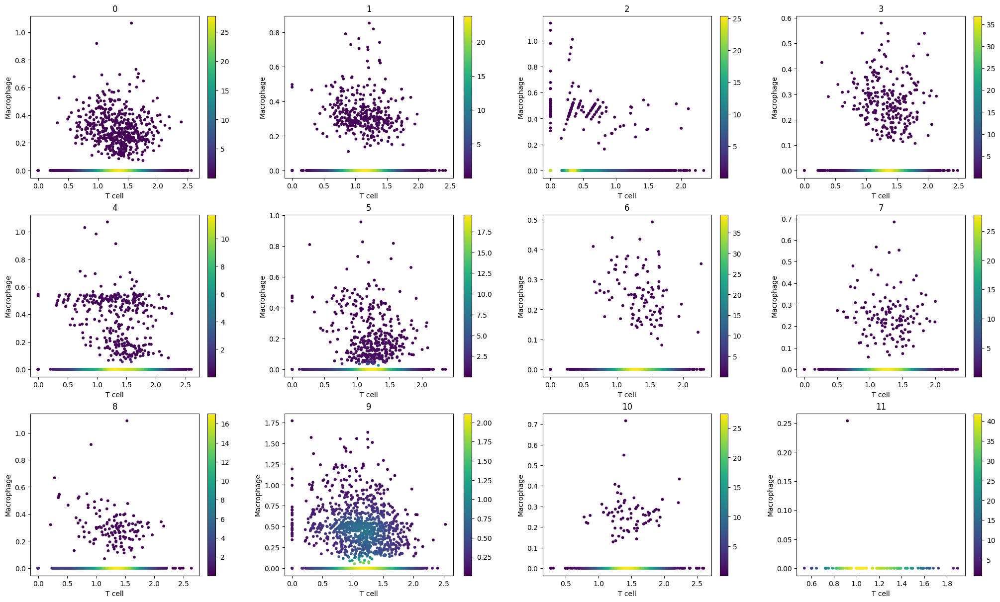

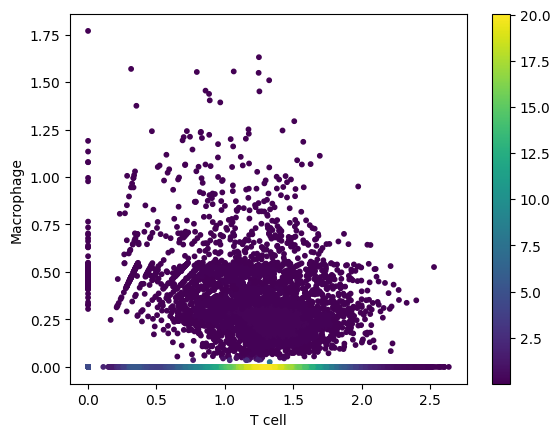

In [13]:
# macrophage & T_ls_good
Tcell_markers = ['CD3E','CD3D','TRAC','TRBC1','TRBC2','TRDC']
Macrophage = ['CD68','MRC1','MSR1','NRP1']#,'CD86'
namex = 'T cell'
namey = 'Macrophage'
view_doublets_bycluster(Tcell_markers,Macrophage,namex,namey,tcell_ann)
macrophage_doublet_idx = doublet_lst(Tcell_markers,Macrophage,namex,namey,tcell_ann)

4620


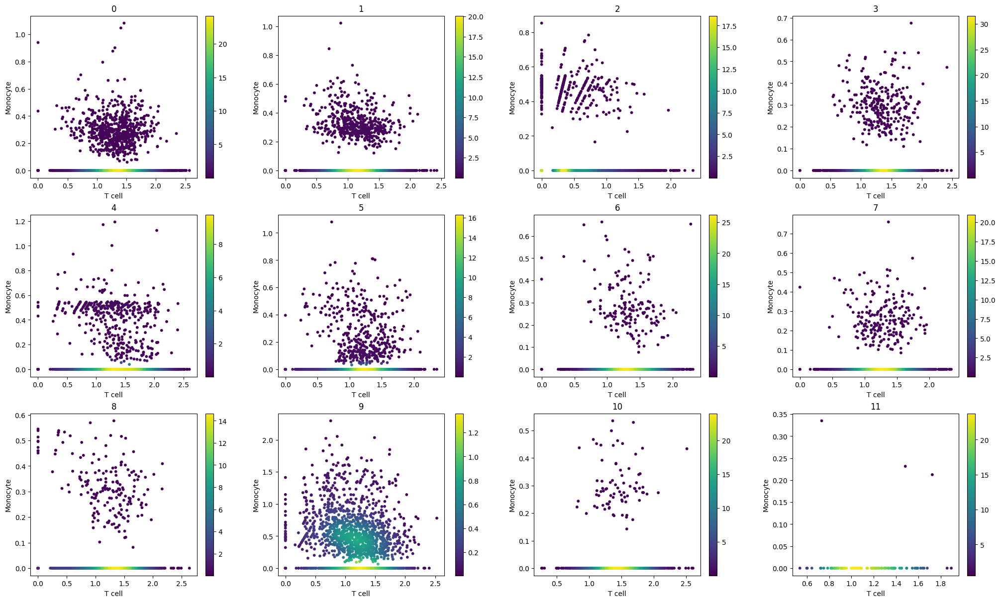

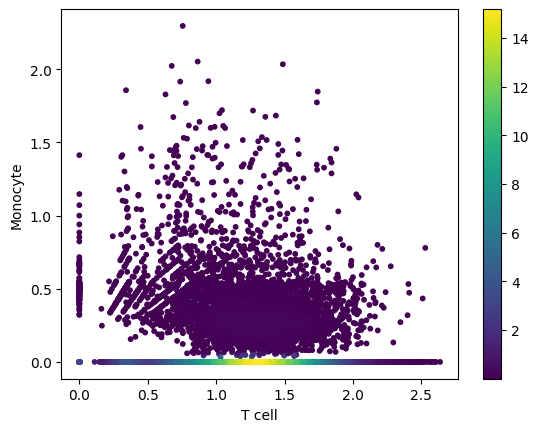

In [14]:
#nomocyte & t_ls_good
Tcell_markers = ['CD3E','CD3D','TRAC','TRBC1','TRBC2','TRDC']
Monocyte = ['CD33','LYZ','FCN1','CSF3R']
namex = 'T cell'
namey = 'Monocyte'
view_doublets_bycluster(Tcell_markers,Monocyte,namex,namey,tcell_ann)
Monocyte_doublet_idx = doublet_lst(Tcell_markers,Monocyte,namex,namey,tcell_ann)

593


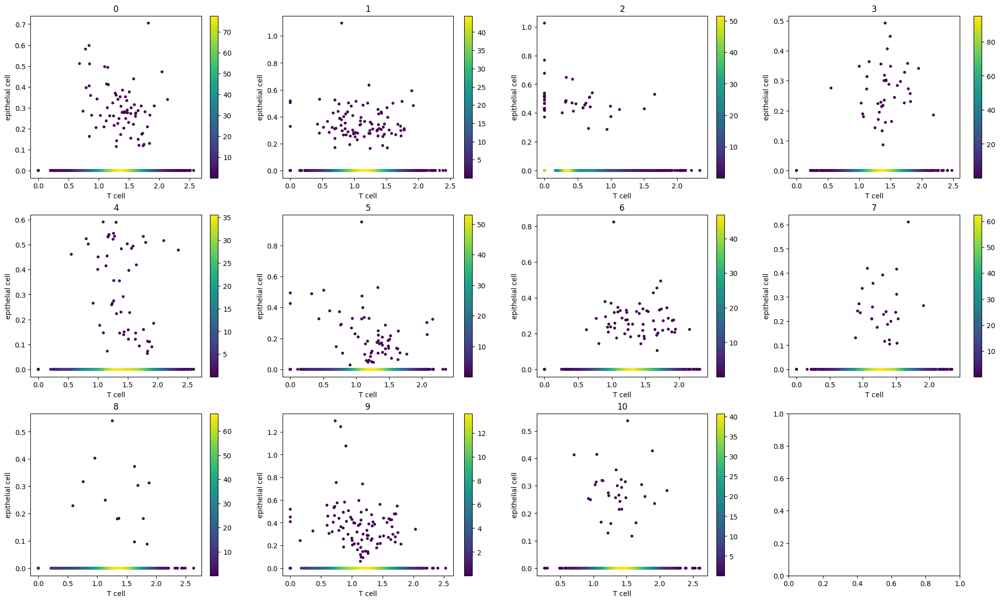

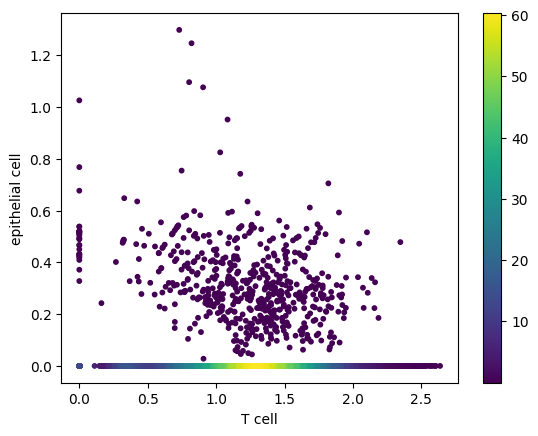

In [15]:
# epithelial cell doublets_ls_good
Tcell_markers = ['CD3E','CD3D','TRAC','TRBC1','TRBC2','TRDC']
epithelial_markers = [ 'VIL1' , 'CLDN3'  ,'OLFM4' ,'LGR5' ]
namex = 'T cell'
namey = 'epithelial cell'
view_doublets_bycluster(Tcell_markers,epithelial_markers,namex,namey,tcell_ann)
epithelial_doublet_idx = doublet_lst(Tcell_markers,epithelial_markers,namex,namey,tcell_ann)

937


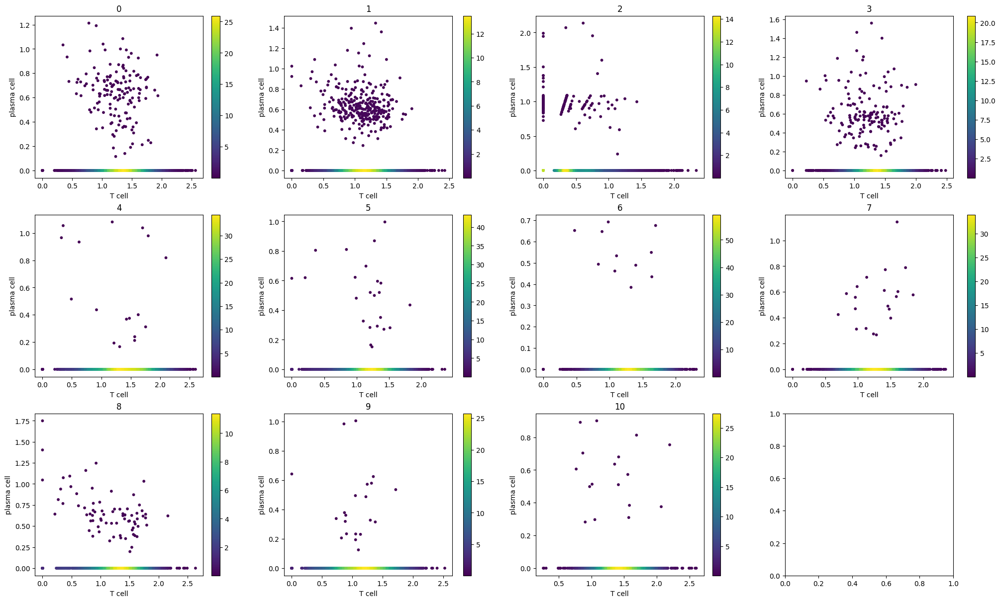

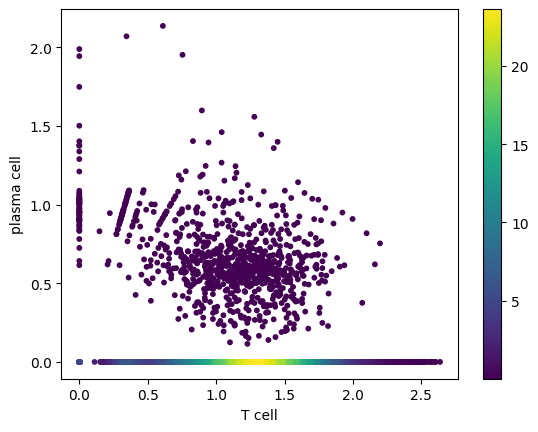

In [16]:
# Plasma cells_ MZB1 'MZB1'
Tcell_markers = ['CD3E','CD3D','TRAC','TRBC1','TRBC2','TRDC']
plasma_markers2 = ['TNFRSF17', 'SDC1']
namex = 'T cell'
namey = 'plasma cell'
view_doublets_bycluster(Tcell_markers,plasma_markers2,namex,namey,tcell_ann)
plasma_doublet2_idx = doublet_lst(Tcell_markers,plasma_markers2,namex,namey,tcell_ann)

1390


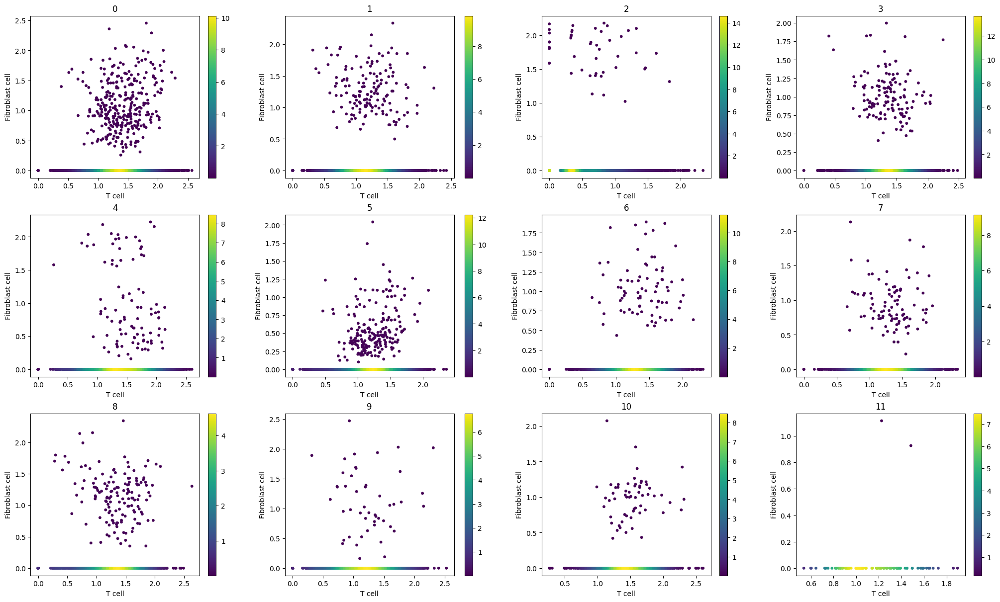

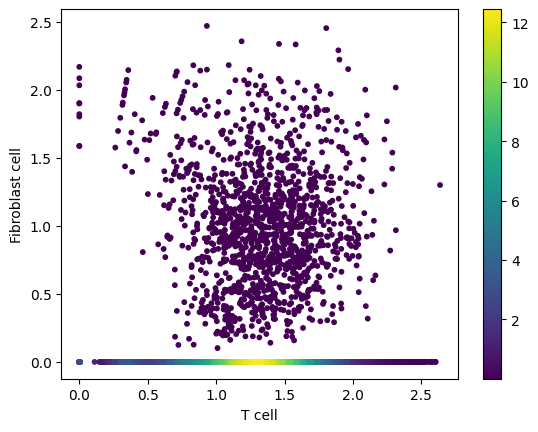

In [17]:
# 'ACTA2'
Fibroblast_markers = ['ACTA2']
Tcell_markers = ['CD3E','CD3D','TRAC','TRBC1','TRBC2','TRDC']
namex = 'T cell'
namey = 'Fibroblast cell'
view_doublets_bycluster(Tcell_markers,Fibroblast_markers,namex,namey,tcell_ann)
Fibroblast_doublet_idx = doublet_lst(Tcell_markers,Fibroblast_markers,namex,namey,tcell_ann)

In [18]:
tcell_ann.obs['B_doublet'] = B_doublet_idx
tcell_ann.obs['B_doublet'] = tcell_ann.obs['B_doublet'].astype(str)

tcell_ann.obs['Myeloid_doublet'] = Myeloid_doublet_idx
tcell_ann.obs['Myeloid_doublet'] = tcell_ann.obs['Myeloid_doublet'].astype(str)


tcell_ann.obs['Macrophage_doublet'] = macrophage_doublet_idx
tcell_ann.obs['Macrophage_doublet'] = tcell_ann.obs['Macrophage_doublet'].astype(str)

tcell_ann.obs['Monocyte_doublet'] = Monocyte_doublet_idx
tcell_ann.obs['Monocyte_doublet'] = tcell_ann.obs['Monocyte_doublet'].astype(str)

tcell_ann.obs['Epithelial_doublet'] = epithelial_doublet_idx
tcell_ann.obs['Epithelial_doublet'] = tcell_ann.obs['Epithelial_doublet'].astype(str)

tcell_ann.obs['Fibroblast_doublet'] = Fibroblast_doublet_idx
tcell_ann.obs['Fibroblast_doublet'] = tcell_ann.obs['Fibroblast_doublet'].astype(str)

# tcell_ann_concat.obs['plasma_doublet'] = plasma_doublet_idx
# tcell_ann_concat.obs['plasma_doublet'] = tcell_ann_concat.obs['plasma_doublet'].astype(str)


tcell_ann.obs['plasma_doublet2'] = plasma_doublet2_idx
tcell_ann.obs['plasma_doublet2'] = tcell_ann.obs['plasma_doublet2'].astype(str)

In [19]:
def plot_doublet(tcell_ann,colorlabel):
# sc.pl.umap(tcell_ann_concat,color = 'B_doublet',
    #            palette={'False':'grey','True':'tab:red'})
    ax=sc.pl.umap(tcell_ann,color = colorlabel,groups=['True'],show=False)

    # We can change the 'NA' in the legend that represents all cells outside of the
    # specified groups
    legend_texts=ax.get_legend().get_texts()
    # Find legend object whose text is "NA" and change it
    for legend_text in legend_texts:
        if legend_text.get_text()=="NA":
            legend_text.set_text('False')

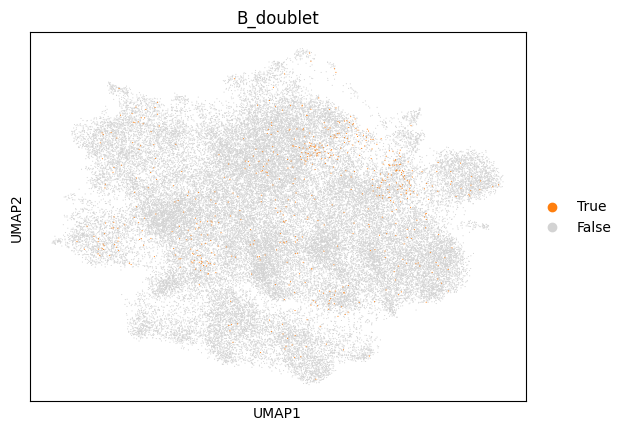

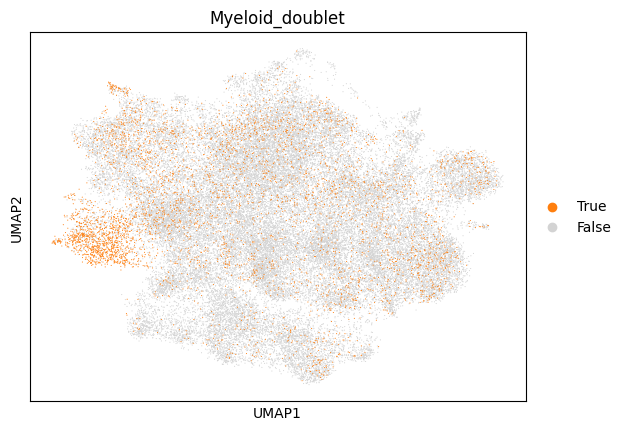

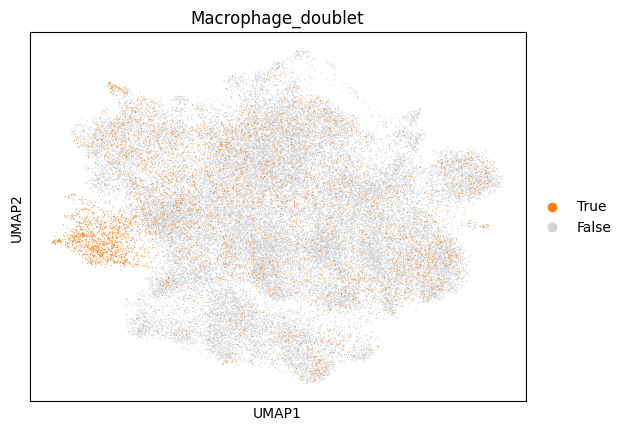

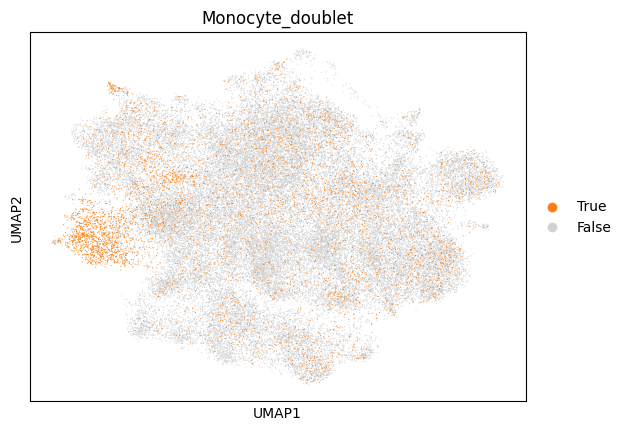

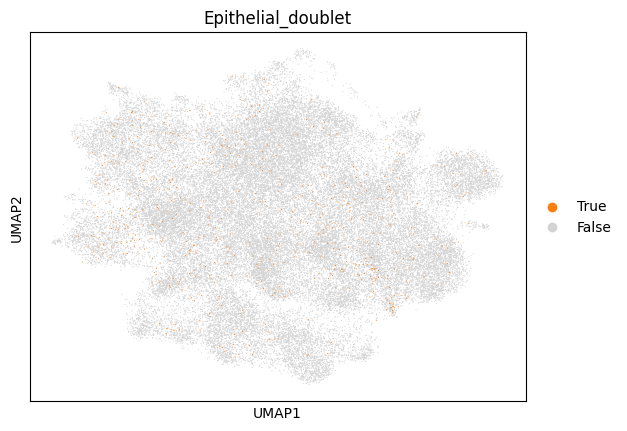

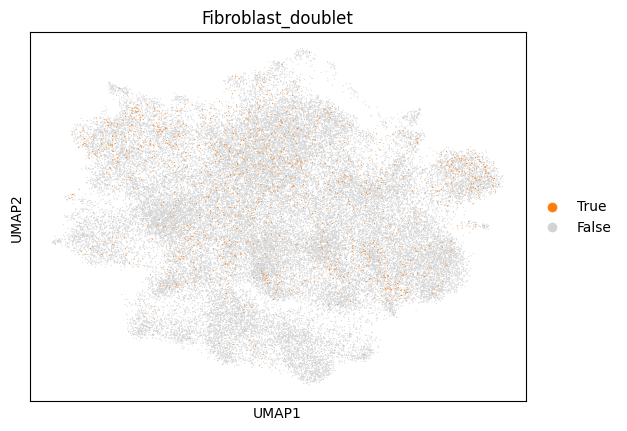

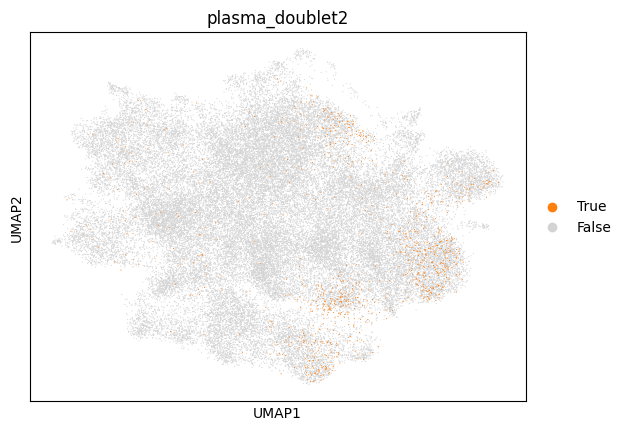

In [20]:
plot_doublet(tcell_ann,'B_doublet')
plot_doublet(tcell_ann,'Myeloid_doublet')
plot_doublet(tcell_ann,'Macrophage_doublet')
plot_doublet(tcell_ann,'Monocyte_doublet')
plot_doublet(tcell_ann,'Epithelial_doublet')
plot_doublet(tcell_ann,'Fibroblast_doublet')
plot_doublet(tcell_ann,'plasma_doublet2')

In [21]:
B_doublet_idx
Myeloid_doublet_idx
macrophage_doublet_idx
Monocyte_doublet_idx
epithelial_doublet_idx
#endothelial_doublet_idx
Fibroblast_doublet_idx 
plasma_doublet2_idx
result = [any([B_doublet_idx[i], Myeloid_doublet_idx[i], 
               macrophage_doublet_idx[i],Monocyte_doublet_idx[i],
                epithelial_doublet_idx[i],Fibroblast_doublet_idx[i],plasma_doublet2_idx[i]]) for i in range(len(B_doublet_idx))]

In [22]:
tcell_ann.obs['if_doublet'] = result

In [23]:
tcell_ann.obs['if_doublet'] = tcell_ann.obs['if_doublet'].astype(str)

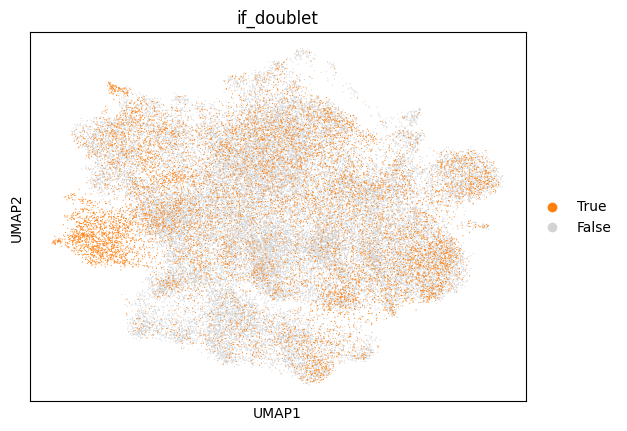

In [24]:
ax=sc.pl.umap(tcell_ann,color = 'if_doublet',groups=['True'],show=False)

# We can change the 'NA' in the legend that represents all cells outside of the
# specified groups
legend_texts=ax.get_legend().get_texts()
# Find legend object whose text is "NA" and change it
for legend_text in legend_texts:
    if legend_text.get_text()=="NA":
        legend_text.set_text('False')

In [25]:
tcell_ann.obs['if_doublet']

R096_Tc17_up_AAACCTGCATCCCACT-1     True
R096_Tc17_up_AAACCTGGTTGGAGGT-1    False
R096_Tc17_up_AAACCTGTCTATCCTA-1    False
R096_Tc17_up_AAACGGGAGGATGCGT-1    False
R096_Tc17_up_AAACGGGGTAAATGAC-1    False
                                   ...  
UA41_TGTTCCGAGGACAGCT-1            False
UA41_TTAGGACGTTGTTTGG-1            False
UA41_TTAGGACTCCCAAGAT-1            False
UA41_TTCGAAGTCCGCATCT-1            False
UA41_TTGCGTCCAAGAAAGG-1            False
Name: if_doublet, Length: 50416, dtype: category
Categories (2, object): ['False', 'True']

In [26]:
tcell_ann_sc = tcell_ann[tcell_ann.obs['if_doublet']== 'False'].copy()

In [27]:
tcell_ann_sc

AnnData object with n_obs × n_vars = 39326 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'hvg', 'leiden', 'leiden_0.15', 'leiden_0.15_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap', 

In [28]:
sc.tl.rank_genes_groups(tcell_ann_sc, groupby="leiden",use_raw=False, method='wilcoxon')
dedf = sc.get.rank_genes_groups_df(tcell_ann_sc, group=None)
dedf.to_csv(DEDF_SC_LEIDEN_OUTPUT_PATH)


In [29]:
### Remove small clusters
# Get the value counts
# remove cluster 9 because it is mainly myeloid doublets
cluster_counts = tcell_ann_sc.obs['leiden'].value_counts()

In [30]:
cluster_counts

leiden
0     8017
2     5477
3     5109
1     5003
4     3844
6     3036
5     2884
7     2258
8     1814
10    1373
9      419
11      92
Name: count, dtype: int64

In [31]:


# Filter out clusters with counts lower than 500
filtered_clusters = cluster_counts[cluster_counts >= 500]

# Get the names of the clusters to keep
clusters_to_keep = filtered_clusters.index

# Filter the AnnData object to keep only the cells in those clusters
filtered_tcell_ann_concat = tcell_ann_sc[tcell_ann_sc.obs['leiden'].isin(clusters_to_keep)].copy()

# Optionally, view the filtered counts
filtered_counts = filtered_tcell_ann_concat.obs['leiden'].value_counts()
filtered_counts

tcell_ann_sc = filtered_tcell_ann_concat.copy()

In [32]:
tcell_ann_sc

AnnData object with n_obs × n_vars = 38815 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'hvg', 'leiden', 'leiden_0.15', 'leiden_0.15_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap', 

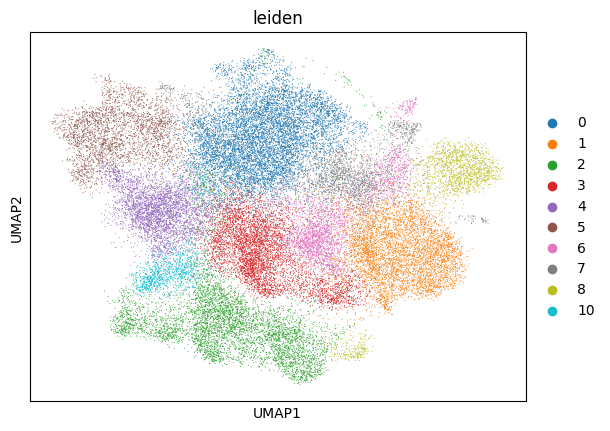

In [33]:
sc.pl.umap(tcell_ann_sc, color=['leiden'], s =2)

In [34]:
cell_type_annotation ={'0': 'CD8+ effector T cells',
 '1': 'CD4+ effector T cells',
 '2': 'Low CD3',
 '3': 'CD8+ tissue resident memory T cells',
 '4': 'CD8+ cytotoxic unconventional T cells',
 '5': 'CD8+ proliferating T cells',
 '6': 'CD4+ effector T cells',
 '7': 'CD4+ central memory T cells',
 '8': 'CD4+ regulatory T cells',
 '10': 'CD8+ homeostatic unconventional T cells'}

In [35]:
tcell_ann_sc.obs["T_cell_subsets"] = (
    tcell_ann_sc.obs["leiden"].map(cell_type_annotation).astype("category")
)

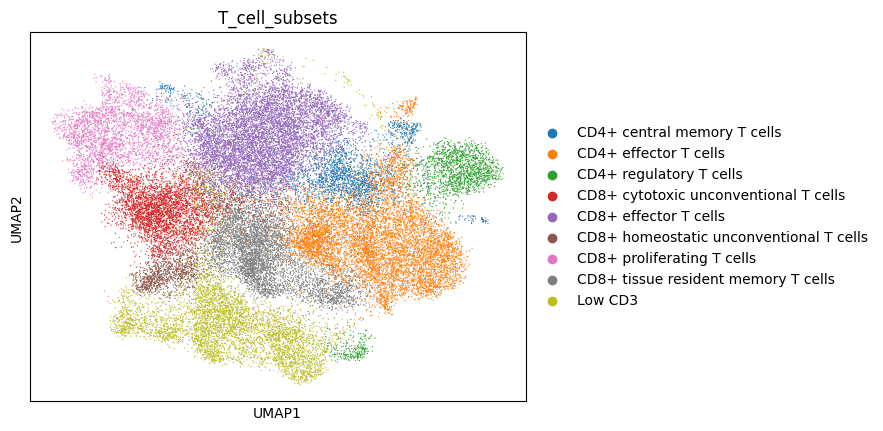

In [36]:
sc.pl.umap(tcell_ann_sc, color="T_cell_subsets")

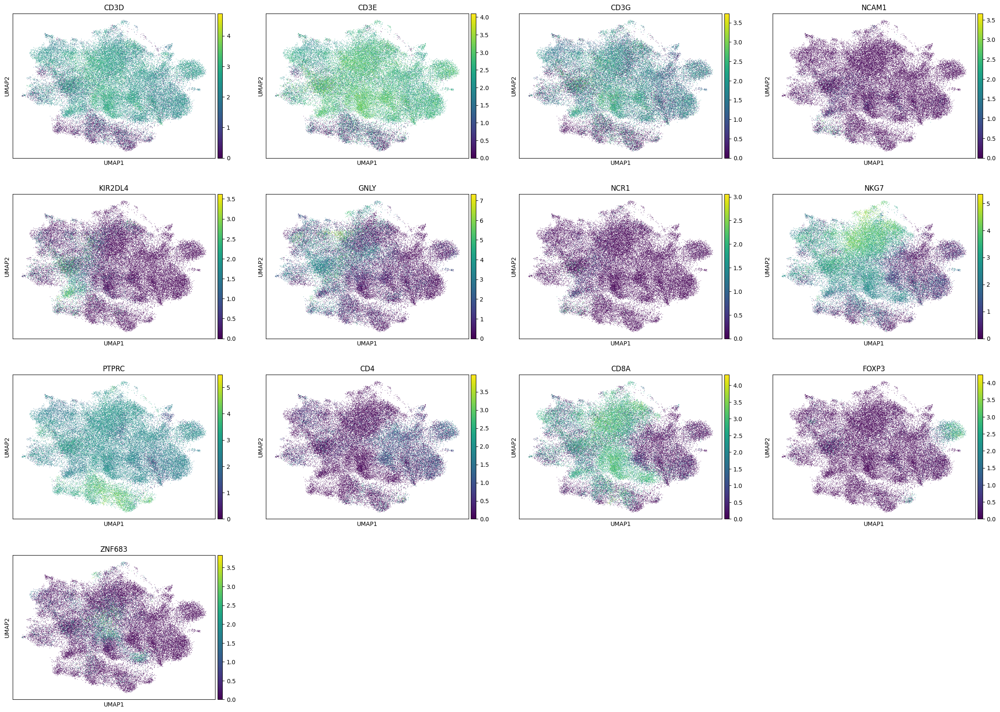

In [37]:
sc.pl.umap(tcell_ann, color=['CD3D','CD3E','CD3G',"NCAM1","KIR2DL4","GNLY","NCR1","NKG7","PTPRC",'CD4','CD8A','FOXP3','ZNF683'])

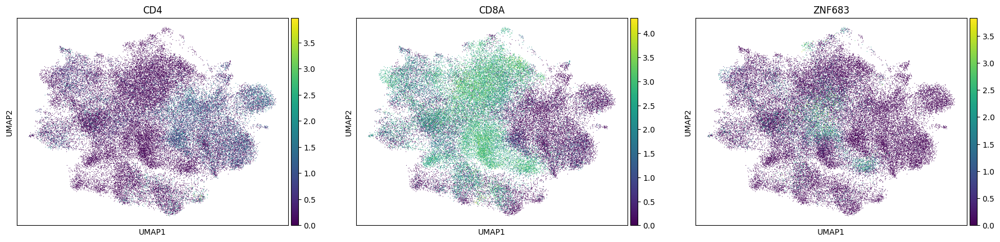

In [38]:
sc.pl.umap(tcell_ann, color=['CD4', 'CD8A','ZNF683'])

In [39]:
tcell_ann_sc_cd4 = tcell_ann_sc[tcell_ann_sc.obs['T_cell_subsets'].isin(['CD4+ effector T cells', 'CD4+ central memory T cells', 'CD4+ regulatory T cells'])].copy()

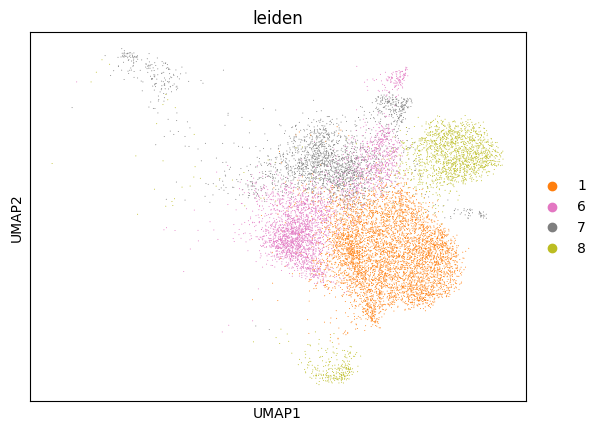

In [40]:
sc.pl.umap(tcell_ann_sc_cd4, color=['leiden'], s =2)

In [41]:
#sc.pp.neighbors(tcell_ann_sc_cd4, use_rep='X_scVI', random_state=0, n_neighbors=25)

In [42]:
sc.tl.leiden(tcell_ann_sc_cd4,resolution=0.2, random_state=0)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_13068/2630517766.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(tcell_ann_sc_cd4,resolution=0.2, random_state=0)


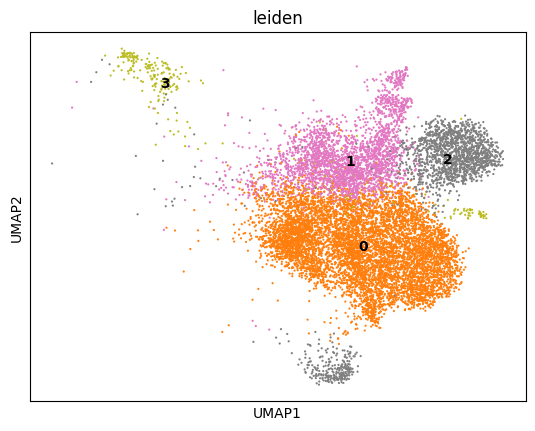

In [43]:
sc.pl.umap(tcell_ann_sc_cd4, color='leiden', legend_loc='on data')

In [44]:
# Get the counts of each cluster
cluster_counts = tcell_ann_sc_cd4.obs['leiden'].value_counts()

# Show clusters being removed (count < 500)
removed_clusters = cluster_counts[cluster_counts < 500]
print("Clusters being removed:")
print(removed_clusters)

# Get barcodes of cells being REMOVED from tcell_ann_sc_cd4
removed_barcodes = tcell_ann_sc_cd4.obs_names[tcell_ann_sc_cd4.obs['leiden'].isin(removed_clusters.index)]
print(f"\nTotal cells to remove: {len(removed_barcodes)}")

# Filter tcell_ann_sc_cd4
clusters_to_keep = cluster_counts[cluster_counts >= 500].index
tcell_ann_sc_cd4 = tcell_ann_sc_cd4[tcell_ann_sc_cd4.obs['leiden'].isin(clusters_to_keep)].copy()
print(f"\ntcell_ann_sc_cd4 shape after filtering: {tcell_ann_sc_cd4.shape}")

Clusters being removed:
leiden
3    276
Name: count, dtype: int64

Total cells to remove: 276

tcell_ann_sc_cd4 shape after filtering: (11835, 38012)


In [45]:
cell_type_annotation ={'0': 'CD4+ effector T cells',
 '1': 'CD4+ central memory T cells',
 '2': 'CD4+ regulatory T cells'}

In [46]:
celltype_colors = {
    "CD4+ effector T cells": "#ff7f0e",                   # orange
    "CD4+ central memory T cells": "#d62728",             # red
    "CD4+ regulatory T cells": "#7f7f7f",                 # gray                               # brown
}

In [47]:
tcell_ann_sc_cd4.obs["T_cell_subsets"] = (
    tcell_ann_sc_cd4.obs["leiden"].map(cell_type_annotation).astype("category")
)

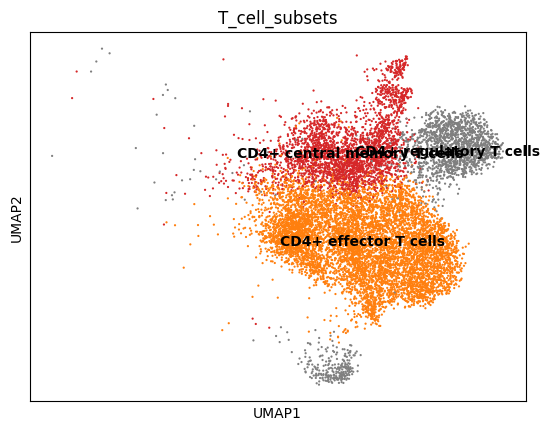

In [48]:
key = "T_cell_subsets"  # your .obs column

# Ensure categorical + ordered (optional but helps keep legend order stable)
order = list(celltype_colors.keys())
tcell_ann_sc_cd4.obs[key] = tcell_ann_sc_cd4.obs[key].astype("category")
tcell_ann_sc_cd4.obs[key] = tcell_ann_sc_cd4.obs[key].cat.reorder_categories(order, ordered=True)

# Store colors in AnnData (Scanpy uses this automatically)
tcell_ann_sc_cd4.uns[f"{key}_colors"] = [celltype_colors[c] for c in tcell_ann_sc_cd4.obs[key].cat.categories]

# Plot
sc.pl.umap(tcell_ann_sc_cd4, color=key, legend_loc="on data")

In [49]:
tcell_ann_sc.obs['T_cell_subsets'] = tcell_ann_sc.obs['T_cell_subsets'].astype(str)

tcell_ann_sc.obs.loc[
    tcell_ann_sc_cd4.obs_names, 'T_cell_subsets'
] = tcell_ann_sc_cd4.obs['T_cell_subsets'].values

tcell_ann_sc.obs['T_cell_subsets'] = tcell_ann_sc.obs['T_cell_subsets'].astype('category')


In [50]:
# Remove only those specific barcodes from tcell_ann_sc
print(f"\ntcell_ann_sc shape before filtering: {tcell_ann_sc.shape}")
tcell_ann_sc = tcell_ann_sc[~tcell_ann_sc.obs_names.isin(removed_barcodes)].copy()
print(f"tcell_ann_sc shape after filtering:  {tcell_ann_sc.shape}")
print(f"Cells removed from tcell_ann_sc: {len(removed_barcodes)}")



tcell_ann_sc shape before filtering: (38815, 38012)
tcell_ann_sc shape after filtering:  (38539, 38012)
Cells removed from tcell_ann_sc: 276


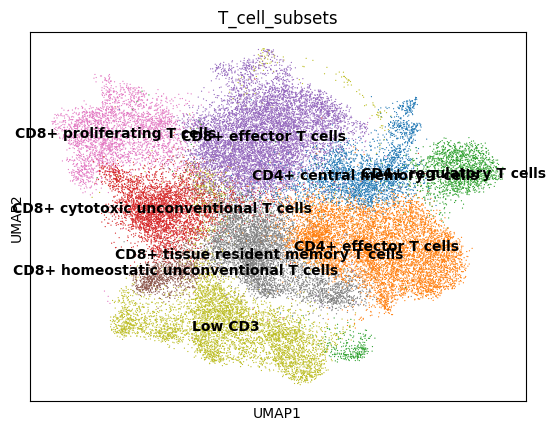

In [51]:
sc.pl.umap(tcell_ann_sc, color='T_cell_subsets', legend_loc='on data')

In [52]:
celltype_colors = {
    "CD8+ effector T cells": "#1f77b4",                   # blue
    "CD8+ cytotoxic unconventional T cells": "#9467bd",   # purple
    "CD8+ tissue resident memory T cells": "#2ca02c",     # green
    "CD8+ homeostatic unconventional T cells": "#bcbd22", # yellow-green
    "CD8+ proliferating T cells": "#e377c2",              # pink
    "CD4+ effector T cells": "#ff7f0e",                   # orange
    "CD4+ central memory T cells": "#d62728",             # red
    "CD4+ regulatory T cells": "#7f7f7f",                 # gray
    "Low CD3": "#8c564b",                                 # brown
}

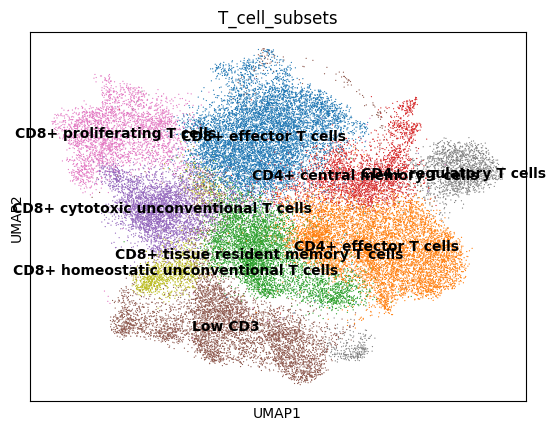

In [53]:
key = "T_cell_subsets"  # your .obs column

# Ensure categorical + ordered (optional but helps keep legend order stable)
order = list(celltype_colors.keys())
tcell_ann_sc.obs[key] = tcell_ann_sc.obs[key].astype("category")
tcell_ann_sc.obs[key] = tcell_ann_sc.obs[key].cat.reorder_categories(order, ordered=True)

# Store colors in AnnData (Scanpy uses this automatically)
tcell_ann_sc.uns[f"{key}_colors"] = [celltype_colors[c] for c in tcell_ann_sc.obs[key].cat.categories]

# Plot
sc.pl.umap(tcell_ann_sc, color=key, legend_loc="on data")

In [54]:
sc.tl.rank_genes_groups(tcell_ann_sc, groupby="T_cell_subsets",use_raw=False, method='wilcoxon')
dedf = sc.get.rank_genes_groups_df(tcell_ann_sc, group=None)
dedf.to_csv(DEDF_SC_OUTPUT_PATH)

In [54]:
tcell_ann_sc.write(TCELL_ANN_SC_PATH)

In [55]:
tcell_ann.write(TCELL_ANN_PATH)